In [1]:
__nbid__ = '0036'
__author__  = 'Alice Jacques <alice.jacques@noirlab.edu>, David Herrera <david.herrera@noirlab.edu>, Astro Data Lab Team <datalab@noirlab.edu>'
__version__ = '20251205' # aaaammdd
__datasets__ = ['ls_dr9', 'sdss_dr17', 'des_dr1', 'smash_dr2', 'unwise_dr1', 'allwise', 'nsc_dr2'] 
__keywords__ = ['crossmatch', 'image cutout']

# Cómo utilizar las tablas previamente cruzadas en Astro Data Lab

por Alice Jacques y el equipo de Astro Data Lab

#### (_Traducción de [How_to_use_pre_crossmatched_tables.ipynb](https://github.com/astro-datalab/notebooks-latest/blob/master/04_HowTos/CrossmatchTables/How_to_use_pre_crossmatched_tables.ipynb)_)

### Tabla de contenido
* [Objetivos y resumen del notebook](#goals)
* [Avisos Legales y Atribuciones](#attribution)
* [Importaciones y configuración](#import)
* [Autenticación](#auth)
* [Acceder a las tablas previas al cruce](#access)
* [Prueba de velocidad](#speedtest)
* [Apéndice](#appendix)
* [Recursos y referencias](#refs)

<a class="anchor" id="goals"></a>
# Objetivos

* Comprender la estructura de las tablas previamente cruzadas en Data Lab.
* Aprender cómo acceder a las tablas previamente cruzadas en Data Lab
* Comparar las velocidades de recuperación entre una tabla de coincidencias cruzadas sobre la marcha y una tabla de coincidencias cruzadas previas

Para ver ejemplos que utilizan las tablas previamente cruzadas alojadas en Astro Data Lab, consulte nuestro [notebook Ejemplos usando tablas previamente cruzadas](https://github.com/astro-datalab/notebooks-latest-es/blob/master/04_ComoHacer/TablasCruzadas/Ejemplos_usando_tablas_previamente_cruzadas.ipynb).

# Resumen

#### Plantilla de nomenclatura de tabla de coincidencias cruzadas
Las tablas de coincidencias cruzadas en Astro Data Lab se denominan de la siguiente manera:

`esquema1.xNpN__tabla1__esquema2__tabla2`

donde la N en NpN codifica el valor numérico del radio de coincidencia cruzada (ya que los puntos '.' no están permitidos en los nombres de las tablas).

Ejemplo:

`ls_dr9.x1p5__tractor__nsc_dr2__objeto`

es una tabla de coincidencias cruzadas (indicada por la x inicial después del punto '.'), ubicada en el esquema ls_dr9, y compara la tabla **ls_dr9.tractor** con la tabla **nsc_dr2.object** (que se encuentra en el esquema nsc_dr2) dentro de un radio de 1,5 segundos de arco ('1p5').

Es cierto que esto es largo, pero limpio, consistente y, lo más importante, analizable. El uso de guiones bajos dobles '\__' es para distinguirlos de los guiones bajos simples que se usan a menudo en los nombres de esquemas y tablas.


#### Columnas en tablas de coincidencias cruzadas
Todas las tablas previamente cruzadas tienen solo estas siete columnas: id1, ra1, dec1, id2, ra2, dec2, distancia. Las descripciones de las columnas en la tabla de comparación previa contienen los nombres de las columnas originales entre paréntesis (esto las hace analizables).

Por ejemplo:

`ls_dr9.x1p5__tractor__nsc_dr2__objeto`

| Columna | Descripción | Tipo de datos |
|----------|--------------------------------------------------|----------|
| id1 | ID en la tabla primera/izquierda  (ls_id) | BIGINT |
| ra1 | Ascensión recta en la tabla izquierda/primera (ra) | DOUBLE |
| dic1 | Declinación en la tabla izquierda/primera (dec) | DOUBLE |
| id2 | ID en la tabla derecha/segunda (id) | VARCHAR |
| ra2 | Ascensión recta en la tabla derecha/segunda (ra) | DOUBLE |
| dic2 | Declinación en la tabla derecha/segunda (dec) | DOUBLE |
| distance | Distancia entre ra1,dec1 y ra2,dec2 (arcsec) | DOUBLE |


#### Tipos de datos en tablas de coincidencias cruzadas

* Los tipos de datos de columna en una tabla previamente cruzada para las columnas id1 e id2 se conservan de las tablas madre. El ejemplo anterior, BIGINT, es válido en muchos casos, pero no tiene por qué serlo para todos los conjuntos de datos.
* Los tipos de datos para las columnas ra1, dec1, ra2, dec2 son DOBLES.
* La distancia de la columna puede ser REAL o DOBLE.

#### Descripción general

* **Los siguientes 5 conjuntos de datos se consideran las principales tablas de referencia** y se comparan con todos los conjuntos de datos (si hay superposición del cielo) y cuando se incorpora un nuevo conjunto de datos:
    - el más reciente gaia_drN.gaia_source
    - el más reciente nsc_drN.object
    - el más reciente unwise_drN.object
    - allwise.source
    - el más reciente sdss_drN.specobj
* **"Crossmatch" significa por ahora "único vecino más cercano"** (y este es el modo actual en Data Lab).
* **Solo tablas de objetos**, no mediciones de una sola época ni tablas de metadatos.
* Para cada tabla de coincidencias cruzadas con la tabla1 como la primera/izquierda y la tabla2 como la segunda/derecha, existe una tabla de coincidencias correspondiente con la tabla2 como la primera/izquierda y la tabla1 como la segunda/derecha.
- Por ejemplo, `allwise.x1p5__source__des_dr2__main` y `des_dr2.x1p5__main__allwise__source`.

La lista de tablas de coincidencias cruzadas disponibles se puede ver en nuestro [explorador de esquemas de tablas](https://datalab.noirlab.edu/query.php) bajo su esquema respectivo.

<a class="anchor" id="attribution"></a>
# Avisos Legales y atribuciones

Avisos Legales
-----------
Tome en cuenta que usar el Astro Data Lab constituye un acuerdo con nuestros [Avisos Legales](https://datalab.noirlab.edu/disclaimers.php) mínimos.

Reconocimientos
---------------
Si ud. usa el **Astro Data Lab** en sus publicaciones de investigación, por favor incluya el siguiente texto en la sección de Reconocimientos de su publicaciones:

_Esta investigación utiliza servicios de datos proveeidos por el Astro Data Lab, el cual es parte del Programa "Community Science and Data Center" (CSDC) (Centro de Ciencia Comunitaria y Datos) del NSF NOIRLab. NOIRLab es operado por la "Association of Universities for Research in Astronomy (AURA), Inc."(Asociación de Universidaddes para la Investigación en Astronomía, Inc.), bajo un acuerdo de cooperación con la "U.S. National Science Foundation" (Fundación Nacional de Ciencia de los EE. UU.)._

Si utiliza **SPARCL junto con la plataforma de Astro Data Lab** (por medio de JupyterLab, línea de comando o interfaz de la web) en su publicación de investigación, por favor incluya el siguiente texto en la sección de Reconocimientos de su publicaciones:

_Esta investigación utiliza servicios o datos proporcionados por el "SPectra Analysis and Retrievable Catalog Lab" (SPARCL) (Laboratorio de Análisis y Catálogo Recuperable de Espectros) y el Astro Data Lab, ambos pertenecientes al Programa "Community Science and Data Center" (CSDC) (Centro de Ciencia Comunitaria y Datos) de NSF NOIRLab. NOIRLab es operado por la "Association of Universities for Research in Astronomy (AURA), Inc." (Asociación de Universidades para la Investigación en Astronomía, Inc.), bajo un acuerdo de cooperación con la "U.S. National Science Foundation" (Fundación Nacional de Ciencia de los EE. UU.)._

En cualquiera de los casos, **por favor cite las siguientes publicaciones**:

* Publicación del concepto de Data Lab: Fitzpatrick et al., "The NOAO Data Laboratory: a conceptual overview", SPIE, 9149, 2014, https://doi.org/10.1117/12.2057445

* Descripción general del Astro Data Lab: Nikutta et al., "Data Lab - A Community Science Platform", Astronomy and Computing, 33, 2020, https://doi.org/10.1016/j.ascom.2020.100411.

Si hace referencia al Jupyterlab / Jupyter notebooks de Data Lab, cite:

* Juneau et al., "Jupyter-Enabled Astrophysical Analysis Using Data-Proximate Computing Platforms", CiSE, 23, 15, 2021, https://doi.org/10.1109/MCSE.2021.3057097.

Si publica en una revista de la AAS, agregue también la palabra clave `\facility{Astro Data Lab}`

Y si está usando SPARCL, por vor agregue también `\software{SPARCL}` y cite:

* Juneau et al., "SPARCL: SPectra Analysis and Retrievable Catalog Lab", Conference Proceedings for ADASS XXXIII, 2024
https://doi.org/10.48550/arXiv.2401.05576.

La biblioteca de NOIRLab mantiene [listas de reconocimientos apropiados](https://noirlab.edu/science/about/scientific-acknowledgments) para usar cuando se hacen publicaciones utilizando los recursos, servicios o datos del Laboratorio.

---- **Versión en Inglés** ----


# Disclaimer & attribution

Disclaimers
-----------
Note that using the Astro Data Lab constitutes your agreement with our minimal [Disclaimers](https://datalab.noirlab.edu/disclaimers.php).

Acknowledgments
---------------
If you use **Astro Data Lab** in your published research, please include the text in your paper's Acknowledgments section:

_This research uses services or data provided by the Astro Data Lab, which is part of the Community Science and Data Center (CSDC) Program of NSF NOIRLab. NOIRLab is operated by the Association of Universities for Research in Astronomy (AURA), Inc. under a cooperative agreement with the U.S. National Science Foundation._

If you use **SPARCL jointly with the Astro Data Lab platform** (via JupyterLab, command-line, or web interface) in your published research, please include this text below in your paper's Acknowledgments section:

_This research uses services or data provided by the SPectra Analysis and Retrievable Catalog Lab (SPARCL) and the Astro Data Lab, which are both part of the Community Science and Data Center (CSDC) Program of NSF NOIRLab. NOIRLab is operated by the Association of Universities for Research in Astronomy (AURA), Inc. under a cooperative agreement with the U.S. National Science Foundation._

In either case **please cite the following papers**:

* Data Lab concept paper: Fitzpatrick et al., "The NOAO Data Laboratory: a conceptual overview", SPIE, 9149, 2014, https://doi.org/10.1117/12.2057445

* Astro Data Lab overview: Nikutta et al., "Data Lab - A Community Science Platform", Astronomy and Computing, 33, 2020, https://doi.org/10.1016/j.ascom.2020.100411

If you are referring to the Data Lab JupyterLab / Jupyter Notebooks, cite:

* Juneau et al., "Jupyter-Enabled Astrophysical Analysis Using Data-Proximate Computing Platforms", CiSE, 23, 15, 2021, https://doi.org/10.1109/MCSE.2021.3057097

If publishing in a AAS journal, also add the keyword: `\facility{Astro Data Lab}`

And if you are using SPARCL, please also add `\software{SPARCL}` and cite:

* Juneau et al., "SPARCL: SPectra Analysis and Retrievable Catalog Lab", Conference Proceedings for ADASS XXXIII, 2024
https://doi.org/10.48550/arXiv.2401.05576

The NOIRLab Library maintains [lists of proper acknowledgments](https://noirlab.edu/science/about/scientific-acknowledgments) to use when publishing papers using the Lab's facilities, data, or services.


<a class="anchor" id="import"></a>
# Importaciones y configuración

In [1]:
# Biblioteca estándar
from getpass import getpass

# De terceros
from astropy.utils.data import download_file  # importar archivo desde URL
from matplotlib.ticker import NullFormatter
import pylab as plt
import matplotlib
%matplotlib inline

# De Data Lab
from dl import authClient as ac, queryClient as qc, storeClient as sc
from dl.helpers.utils import convert # convierte la tabla en un objeto de marco de datos de Pandas

<a class="anchor" id="auth"></a>
# Autenticación
Se puede acceder a gran parte de la funcionalidad de Data Lab sin iniciar sesión explícitamente (el servicio utiliza un inicio de sesión anónimo). Pero algunas capacidades, por ejemplo guardar los resultados de sus consultas en su espacio de almacenamiento virtual, requieren un inicio de sesión (es decir, necesitará una cuenta de usuario registrada).

Si necesita iniciar sesión en Data Lab, descomente la celda a continuación y ejecútela:

In [2]:
# token = ac.login(input("Ingrese el nombre de usuario: (+ENTER) "), getpass("Ingrese la contraseña: (+ENTER) "))
ac.whoAmI()

'demo01'

<a class="anchor" id="access"></a>
# Accediendo a las tablas previamente cruzadas
Podemos utilizar Query Client de Data Lab para acceder a las tablas previamente cruzadas alojadas en Data Lab. Primero, obtengamos un conteo total de la cantidad de objetos (nrows) en SDSS DR17 que también están en LS DR9:

In [3]:
query="SELECT nrows FROM tbl_stat WHERE schema='sdss_dr17' and tbl_name='x1p5__specobj__ls_dr9__tractor'"

# Administrador de consultas de llamadas
response = qc.query(sql=query)
print(response)

nrows
4559653



Ahora imprimamos solo las primeras 100 filas:

In [4]:
query = "SELECT * FROM sdss_dr17.x1p5__specobj__ls_dr9__tractor LIMIT 100"
result = qc.query(sql=query,fmt='pandas')
result

,id1,ra1,dec1,id2,ra2,dec2,distance
0,3384465917919389696,287.22826,48.064735,9907737095837650,287.228165,48.064735,0.227509
1,3384466192797296640,287.44889,48.229698,9907737159009377,287.448870,48.229697,0.049226
2,3384462344506599424,287.38750,48.168965,9907737158950166,287.387517,48.168933,0.121452
3,3384463718896134144,287.69779,48.382804,9907737221862367,287.697861,48.382752,0.252610
4,3384465093285668864,287.54718,48.407654,9907737221859120,287.547174,48.407548,0.381269
...,...,...,...,...,...,...,...
95,3384469766210086912,287.60106,48.844872,9907737284317775,287.601034,48.844932,0.223774
96,3384471690355435520,287.70990,48.888661,9907737346511898,287.709937,48.888637,0.123855
97,3384469491332179968,287.66389,48.944252,9907737346510986,287.663800,48.944491,0.887495
98,3384480486448457728,287.22115,48.827232,9907737284252188,287.221105,48.827183,0.206944


<a class="anchor" id="speedtest"></a>
# Prueba de velocidad

### Primer ejemplo
Aquí comparamos la velocidad de usar la función `q3c_join()` para realizar coincidencias cruzadas directamente en una consulta (`query1`) versus usar una tabla previamente cruzada y una declaración JOIN (`query2`). Recuperamos las mismas columnas especificadas y las mismas filas aleatorias para las dos consultas. Veremos que "consulta2" recupera resultados más rápido de lo que "consulta1" puede recuperar resultados.

#### Primero, ejecutando la coincidencia cruzada nosotros mismos:

In [5]:
query1 = """
SELECT
    a.source_id AS id1, a.ra AS ra1, a.dec AS dec1,
    gg.specobjid AS id2, gg.ra AS ra2, gg.dec AS dec2,
    (q3c_dist(a.ra, a.dec, gg.ra, gg.dec)*3600) AS distance 
FROM 
    allwise.source AS a
INNER JOIN LATERAL (
    SELECT 
        s.specobjid, s.ra, s.dec
    FROM 
        sdss_dr17.specobj AS s
    WHERE
        q3c_join(a.ra, a.dec, s.ra, s.dec, 1.5/3600.0)
    ORDER BY
        random()
    ASC LIMIT 1
) AS gg ON true
WHERE 
    a.random_id BETWEEN 10 and 10.01
    """
df1 = qc.query(sql=query1,fmt='pandas',timeout=600)
df1 = df1.sort_values('id1')

#### Ahora, lo mismo pero usando tablas previamente cruzadas:

In [6]:
query2 = """
SELECT 
    X.id1, X.id2, X.ra1, X.dec1, X.ra2, X.dec2, X.distance
FROM 
    allwise.x1p5__source__sdss_dr17__specobj AS X 
JOIN 
    allwise.source AS a ON X.id1 = a.source_id 
WHERE 
    a.random_id BETWEEN 10 and 10.01
"""
df2 = qc.query(sql=query2,fmt='pandas')
df2 = df2.sort_values('id1')

#### Histogramas de distancia para el primer ejemplo
Aquí graficamos los dos histogramas de distancia para demostrar que los resultados obtenidos por las consultas cruzadas JOIN y q3c son idénticos.

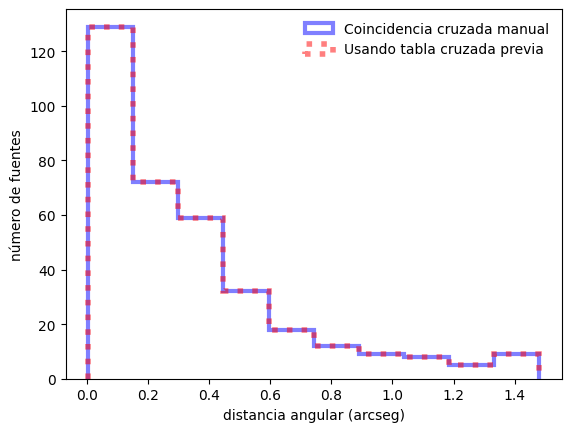

In [7]:
plt.hist(df1['distance'],histtype='step',color='b',lw=3,ls='-',alpha=0.5,label='Coincidencia cruzada manual')
plt.hist(df2['distance'],histtype='step',color='r',lw=4,ls=':',alpha=0.5,label='Usando tabla cruzada previa')
plt.xlabel('distancia angular (arcseg)')
plt.ylabel('número de fuentes')
plt.legend(loc='upper right',frameon=False)
plt.show()

### Segundo ejemplo: usamos un catálogo diferente y cambiamos el orden de las consultas
Nuevamente seleccionamos objetos de dos catálogos y recuperamos las mismas columnas específicas y las mismas filas aleatorias para dos consultas. `query3` usa una tabla previamente cruzada y una consulta JOIN, mientras que `query4` realiza coincidencias cruzadas directamente en la consulta usando la función `q3c_join()`. Veremos que `query3` recupera resultados más rápido de lo que `query4` puede recuperar resultados.

#### Primero, usando tablas previamente cruzadas:

In [8]:
query3 = """
SELECT 
    X.id1, X.id2, X.ra1, X.dec1, X.ra2, X.dec2, X.distance
FROM 
    unwise_dr1.x1p5__object__sdss_dr17__specobj AS X 
JOIN
    unwise_dr1.object AS u ON X.id1 = u.unwise_objid
WHERE
    u.random_id BETWEEN 10 and 10.01
"""
df3 = qc.query(sql=query3,fmt='pandas',timeout=600)
df3 = df3.sort_values('id1')

#### Ahora, ejecutando la coincidencia cruzada nosotros mismos:

In [9]:
query4 = """
SELECT
    u.unwise_objid AS id1, u.ra AS ra1 ,u.dec AS dec1,
    ss.specobjid AS id2, ss.ra AS ra2, ss.dec AS dec2,
    (q3c_dist(u.ra, u.dec, ss.ra, ss.dec)*3600.0) AS distance 
FROM 
    unwise_dr1.object AS u
INNER JOIN LATERAL (
    SELECT 
        s.specobjid, s.ra, s.dec
    FROM 
        sdss_dr17.specobj AS s
    WHERE
        q3c_join(u.ra, u.dec, s.ra, s.dec, 1.5/3600.0)
    ORDER BY
        random()
    ASC LIMIT 1
) as ss ON true
WHERE 
    u.random_id BETWEEN 10 and 10.01
"""
df4 = qc.query(sql=query4,fmt='pandas',timeout=600)
df4 = df4.sort_values('id1')

#### Histogramas de distancia para el segundo ejemplo
Aquí graficamos los dos histogramas de distancia para demostrar que los resultados obtenidos por las consultas cruzadas JOIN y q3c son idénticos.

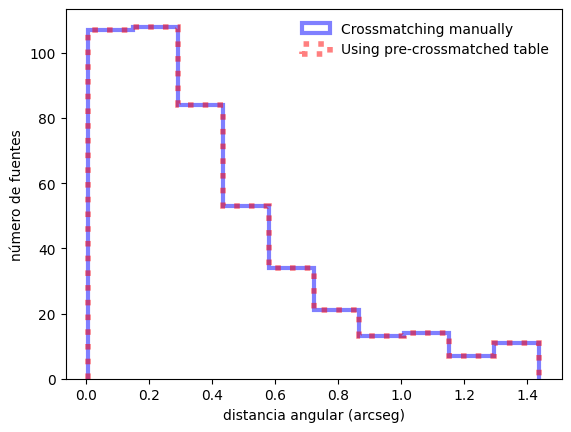

In [10]:
plt.hist(df4['distance'],histtype='step',color='b',lw=3,ls='-',alpha=0.5,label='Crossmatching manually')
plt.hist(df3['distance'],histtype='step',color='r',lw=4,ls=':',alpha=0.5,label='Using pre-crossmatched table')
plt.xlabel('distancia angular (arcseg)')
plt.ylabel('número de fuentes')
plt.legend(loc='upper right',frameon=False)
plt.show()

<a class="anchor" id="appendix"></a>
# Apéndice

Un claro beneficio de las tablas previamente cruzadas es que contienen las posiciones de los mismos objetos en dos conjuntos de datos. Podemos usar esto para, por ejemplo. buscar imágenes de un objeto de ambas surveys.

## A1. imprudente DR1 vs LS DR9
Aquí compararemos dos imágenes del mismo objeto de dos catálogos diferentes, unWISE DR1 y LS DR9.

### Función para recuperar recortes

In [11]:
def make_cutout_comparison_table(ra_in1, dec_in1, layer1, layer2, pixscale, ra_in2=None, dec_in2=None):
    """
    Obtenga imágenes JPEG en color de la herramienta de recorte del equipo Legacy Survey en NERSC
    """
    img1 = []
    img2 = []
    
    for i in range(len(ra_in1)):
        cutout_url1 = "https://www.legacysurvey.org/viewer/cutout.jpg?ra=%g&dec=%g&layer=%s&pixscale=%s" % (ra_in1[i],dec_in1[i],layer1,pixscale)
        img = plt.imread(download_file(cutout_url1,cache=True,show_progress=False,timeout=120))
        img1.append(img)
        
        cutout_url2 = "https://www.legacysurvey.org/viewer/cutout.jpg?ra=%g&dec=%g&layer=%s&pixscale=%s" % (ra_in2[i],dec_in2[i],layer2,pixscale)
        img = plt.imread(download_file(cutout_url2,cache=True,show_progress=False,timeout=120))
        img2.append(img)

    return img1,img2

### Función para generar gráficos.

In [12]:
def plot_cutouts(img1,img2,cat1,cat2):
    """
    Graficar imágenes en dos filas con 5 imágenes en cada fila
    """
    fig = plt.figure(figsize=(21,7))

    for i in range(len(img1)):
        ax = fig.add_subplot(2,6,i+1)
        ax.imshow(img1[i])
        ax.xaxis.set_major_formatter(NullFormatter())
        ax.yaxis.set_major_formatter(NullFormatter())
        ax.tick_params(axis='both',which='both',length=0)
        ax.text(0.02,0.93,'ra=%.5f'%list_ra1[i],transform=ax.transAxes,fontsize=12,color='white')
        ax.text(0.02,0.85,'dec=%.5f'%list_dec1[i],transform=ax.transAxes,fontsize=12,color='white')
        ax.text(0.02,0.77,cat1,transform=ax.transAxes,fontsize=12,color='white')

        ax = fig.add_subplot(2,6,i+7)
        ax.imshow(img2[i])
        ax.xaxis.set_major_formatter(NullFormatter())
        ax.yaxis.set_major_formatter(NullFormatter())
        ax.tick_params(axis='both',which='both',length=0)
        ax.text(0.02,0.93,'ra=%.5f'%list_ra2[i],transform=ax.transAxes,fontsize=12,color='white')
        ax.text(0.02,0.85,'dec=%.5f'%list_dec2[i],transform=ax.transAxes,fontsize=12,color='white')
        ax.text(0.02,0.77,cat2,transform=ax.transAxes,fontsize=12,color='white')

    plt.subplots_adjust(wspace=0.02, hspace=0.03)

### Escriba una consulta para seleccionar aleatoriamente cinco objetivos (posiciones RA/Dec) de la tabla de coincidencias cruzadas de unWISE DR1 y LS DR9.
... luego guárdelos como matrices y configure los títulos, las capas y la escala de píxeles. Finalmente graficamos las imágenes recortadas.

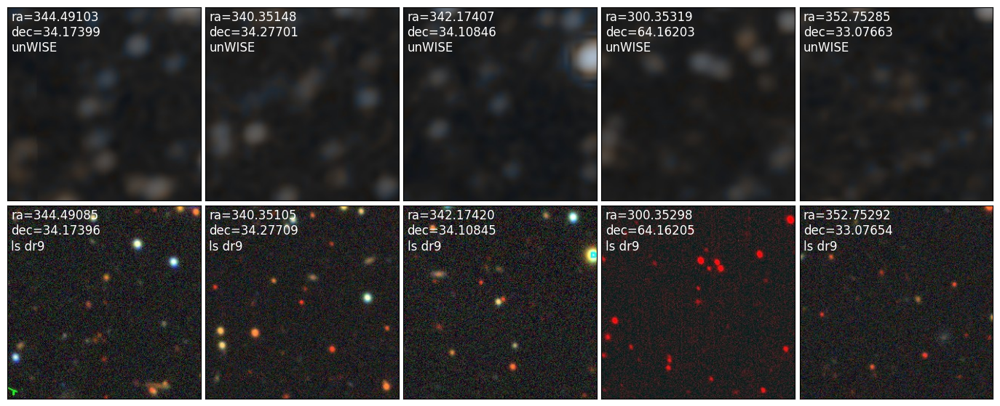

In [14]:
q = """
SELECT
    ra1, dec1, ra2, dec2 
FROM
    unwise_dr1.x1p5__object__ls_dr9__tractor 
WHERE
    ra1>300 and dec1>33 
ORDER BY
    random() 
LIMIT 5
"""

r = qc.query(sql=q,fmt='pandas')

list_ra1=r['ra1'].values       # ".values" convertidos a matriz de numpy
list_dec1=r['dec1'].values
list_ra2=r['ra2'].values       
list_dec2=r['dec2'].values

cat1='unWISE'
cat2='ls dr9'
layer1='unwise-neo6'
layer2='ls-dr9'
pixscale='0.3'
img1,img2 = make_cutout_comparison_table(list_ra1,list_dec1,layer1,layer2,
                                         pixscale,list_ra2,list_dec2)
plot_cutouts(img1,img2,cat1,cat2)

## A2. SDSS frente a DES DR1
Aquí compararemos dos imágenes del mismo objeto de dos catálogos diferentes, SDSS y DES DR1.

### Escribir consulta para seleccionar aleatoriamente cinco objetivos (posiciones AR/Dec) de la tabla de coincidencias cruzadas SDSS DR17 y DES DR1
... luego los guardamos como matrices y configuramos los títulos, las capas y la escala de píxeles. Finalmente graficamos las imágenes recortadas.

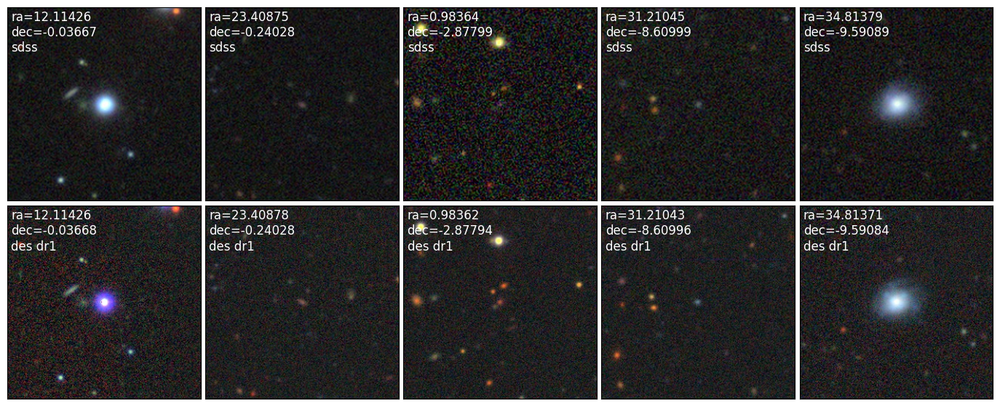

In [15]:
q = """
SELECT
    ra1, dec1, ra2, dec2 
FROM
    sdss_dr17.x1p5__specobj__des_dr1__main 
ORDER BY
    random() 
LIMIT 5
"""

r = qc.query(sql=q,fmt='pandas')

list_ra1=r['ra1'].values       # ".values" convert to numpy array
list_dec1=r['dec1'].values
list_ra2=r['ra2'].values       
list_dec2=r['dec2'].values

cat1='sdss'
cat2='des dr1'
layer1='sdss'
layer2='des-dr1'
pixscale='0.25'
img1,img2 = make_cutout_comparison_table(list_ra1,list_dec1,layer1,layer2,
                                         pixscale,list_ra2,list_dec2)
plot_cutouts(img1,img2,cat1,cat2)

## A3. Hallazgos interesantes de galaxias: SDSS vs DES DR1

Comparamos dos imágenes de la misma galaxia de dos catálogos diferentes, SDSS y DES DR1. Usamos una lista de galaxias identificadas (posiciones AR/Dec) para comparar la diferencia en características observables y calidad entre los dos catálogos.

Primero importamos el archivo CSV de galaxias identificadas (posiciones RA/Dec) a MyDB:

In [16]:
qc.mydb_import('gals','./gals.csv',drop=True)

'OK'

Escribimos la consulta para seleccionar las primeras cinco posiciones AR/Dec de nuestra tabla. Luego los guardamos como matrices y configuramos los títulos, las capas y la escala de píxeles. Finalmente graficamos las imágenes recortadas.

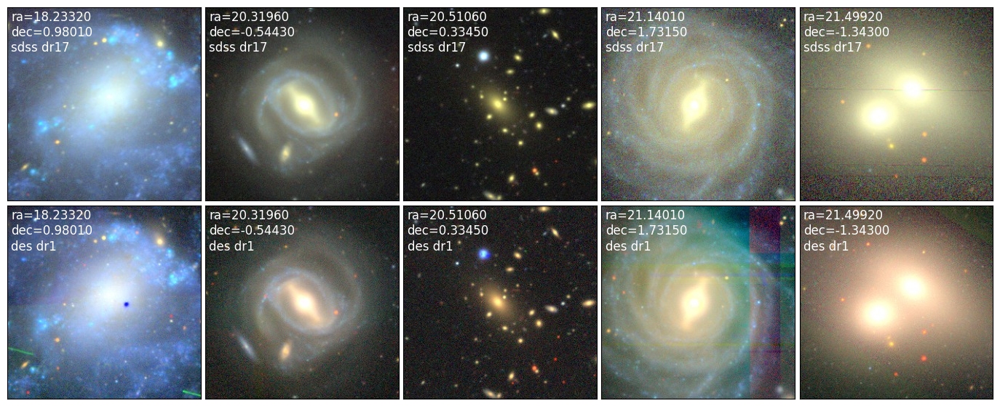

In [17]:
qg = "SELECT ra, dec FROM mydb://gals LIMIT 5"
rg = qc.query(sql=qg)
rp = convert(rg)
list_ra1=rp['ra'].values 
list_dec1=rp['dec'].values
list_ra2=rp['ra'].values
list_dec2=rp['dec'].values

cat1='sdss dr17'
cat2='des dr1'
layer1='sdss'
layer2='des-dr1'
pixscale='0.5'

img1,img2 = make_cutout_comparison_table(list_ra1,list_dec1,layer1,layer2,
                                        pixscale,ra_in2=list_ra1,dec_in2=list_dec1)
plot_cutouts(img1,img2,cat1,cat2)

Escribimos la siguiente consulta para seleccionar las siguientes cinco posiciones AR/Dec de nuestra tabla. Luego los guardamos como matrices y configuramos los títulos, las capas y la escala de píxeles. Finalmente graficamos las imágenes recortadas.

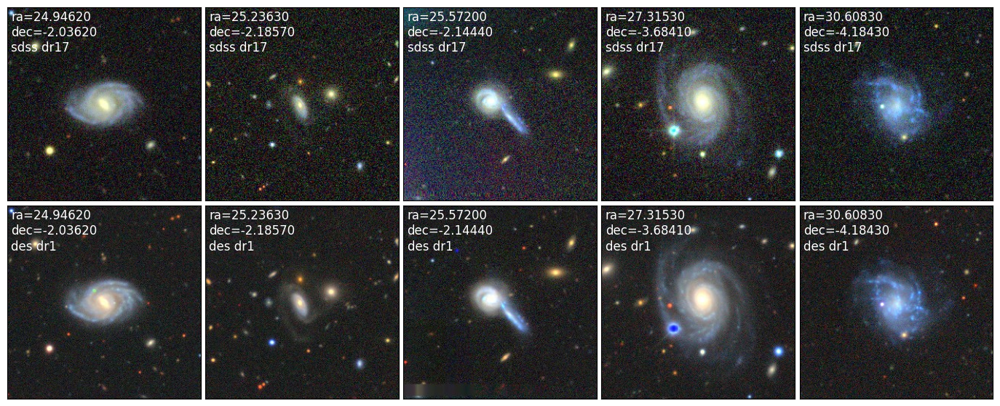

In [18]:
qg = "SELECT ra, dec FROM mydb://gals LIMIT 5 OFFSET 5"
rg = qc.query(sql=qg)
rp = convert(rg)
list_ra1=rp['ra'].values      
list_dec1=rp['dec'].values
list_ra2=rp['ra'].values     
list_dec2=rp['dec'].values

img1,img2 = make_cutout_comparison_table(list_ra1,list_dec1,layer1,layer2,
                                        pixscale,ra_in2=list_ra1,dec_in2=list_dec1)
plot_cutouts(img1,img2,cat1,cat2)

Escribimos la siguiente consulta para seleccionar las últimas cinco posiciones RA/Dec de nuestra tabla. Luego los guardamos como matrices y configuramos los títulos, las capas y la escala de píxeles. Finalmente graficamos las imágenes recortadas.

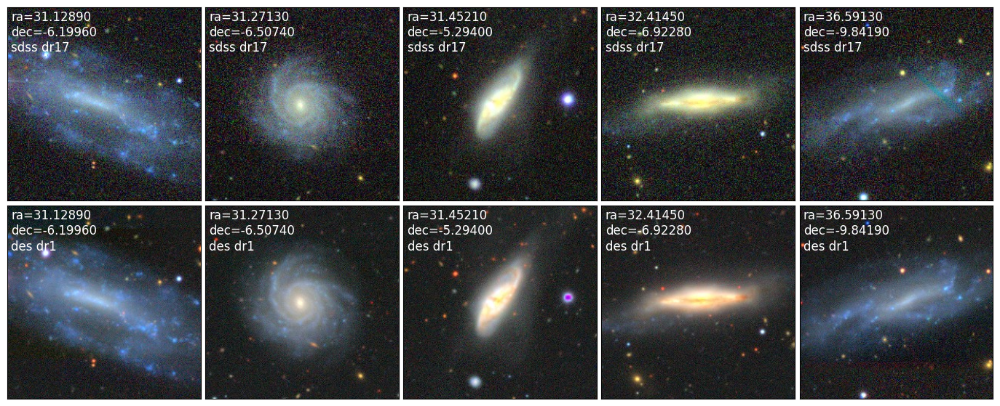

In [19]:
qg = "SELECT ra, dec FROM mydb://gals LIMIT 5 OFFSET 10"
rg = qc.query(sql=qg)
rp = convert(rg)
list_ra1=rp['ra'].values    
list_dec1=rp['dec'].values
list_ra2=rp['ra'].values     
list_dec2=rp['dec'].values

img1,img2 = make_cutout_comparison_table(list_ra1,list_dec1,layer1,layer2,
                                        pixscale,ra_in2=list_ra1,dec_in2=list_dec1)
plot_cutouts(img1,img2,cat1,cat2)

<a class="anchor" id="refs"></a>
# Recursos y referencias

Navegador Legacy Survey Sky: https://www.legacysurvey.org/viewer#NGC%203098